In [1]:
import numpy as np
import os
from utils import * 
import skimage.io as io
import sys
sys.stdout = open('prints.txt', 'w')
from IPython import display
args = {
        "path": "/asap3/petra3/gpfs/p05/2023/data/11016663//processed/thomas_001_d150/flat_corrected/rawBin2/",
        "idx": 89,
        "energy_kev": 18.0,
        "detector_pixel_size": 2.57 * 1e-6,
        "distance_sample_detector": 0.15,
        "alpha": 1e-8,
        "delta_beta": 1,
        "pad": 1,
        "method": 'TIE',
        'iter_num': 200,
        'conv_num': 32,
        'conv_size': 3,
        'dropout': 0.25,
        'l1_ratio': 10,
        'abs_ratio': 1.0,
        'g_learning_rate': 1e-3,
        'd_learning_rate': 1e-5,
        'phase_only': False,
        'save_wpath': None,
        'init_wpath': None,
        'init_model': False,
        'recon_monitor': True,
        'seed': 42,
        'filter': True,
        'generator': None,
        'discriminator': None,
        'filter_optimizer': None,
        'generator_optimizer': None,
        'discriminator_optimizer': None,
    }


In [5]:
import torch
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import joblib 
from joblib import Parallel, delayed
from torchsummary import summary

def torch_reshape(image):
    #if it's tensor and of shape 4, return the image
    if type(image) is torch.Tensor and len(image.shape) == 4:
        return image
    
    if type(image) is list:
        #use joblib to parallelize the process
        if len(image) > 30:
            n_jobs = 30
        else:
            n_jobs = 5
        image = Parallel(n_jobs=n_jobs)(delayed(torch.from_numpy)(image[i]) for i in range(len(image)))
        image = torch.stack(image)

    if type(image) is not torch.Tensor:
            image = torch.from_numpy(image)
    
    if len(image.shape) == 2:
        image = image.unsqueeze(0)
        image = image.unsqueeze(0)
    elif len(image.shape) == 3:
        image = image.unsqueeze(0)    
    elif len(image.shape) > 5:
        image = image.squeeze(1)
        print("Image shape not supported")
        return image
    
    #rearrange the dimension of the image [batch, channel, x, y]
    image = image.permute(1, 0, 2, 3)
    image = image.float()
    return image

def torchnor_phase(image):
    image = torch_reshape(image)
    image = image - torch.min(image)
    if torch.max(image) != 0:
        image = image / torch.max(image)
    return image

def torch_contrast(image, contrast_factor = 0.02):
    if type(image) is not torch.Tensor:
        image = torch_reshape(image)
    image = transforms.functional.adjust_contrast(image, contrast_factor) 
    return image

def torch_brightness(image, brightness_factor = 0.02):
    image = torch_reshape(image)
    image = transforms.functional.adjust_brightness(image, brightness_factor)
    return image

def save_path_generator(**kwargs):
    try:
        file_name = os.path.splitext(os.path.basename(kwargs['image_path']))[0]
        #the folder name of the 'image_path'
        folder = os.path.basename(os.path.dirname(kwargs['image_path']))
    except:
        file_name = os.path.splitext(os.path.basename(kwargs['image_path'][0]))[0]
        folder = os.path.basename(os.path.dirname(kwargs['image_path'][0]))
        
    init_path = os.getcwd() + '/data/saved_weights/' + folder + '/'
    save_wpath = os.getcwd() + '/data/retrieved/' + folder + '/'
    if not os.path.exists(init_path):
        os.makedirs(init_path)
    if not os.path.exists(save_wpath):
        os.makedirs(save_wpath)
    kwargs['file_name'] = file_name
    kwargs['save_wpath'] = save_wpath
    kwargs['init_wpath'] = init_path
    return kwargs 

def get_all_info(path = None, images = None, idx = 1000, energy_kev = 18.0, detector_pixel_size = 2.57 * 1e-6, distance_sample_detector = 0.15, alpha = 1e-8, delta_beta = 1e1, pad = 1, method = 'TIE', file_type = 'tif', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None, **kwargs):
    """
    make sure that the unit of energy is in keV, the unit of detector_pixel_size is in meter, and the unit of distance_sample_detector is in meter
    """

    if path is not None:
        images = list(io.imread_collection(path + '/*.' + file_type).files)
        # images = sorted(glob(path + '/*.tif'))
        if type(idx) is list:
            image_path = [images[i] for i in idx]
            image = load_images_parallel(image_path)
            shape_x = image[0].shape[0]
            shape_y = image[0].shape[1]
            Fx, Fy = grid_generator(shape_x, shape_y, upscale=pad, ps = detector_pixel_size)
            ND = len(idx)
            print("images are of leng", len(image))
        else:
            image_path = images[idx]
            image = load_image(image_path)
            shape_x = image.shape[0]
            shape_y = image.shape[1]
            Fx, Fy = grid_generator(shape_x, shape_y, upscale=pad, ps = detector_pixel_size)
            ND = 1
        assert images is not None, "either image or path should be provided"
        
    else:
        assert images is not None, "either image or path should be provided"
        image_path = images[idx]
        image = load_image(images[idx])
        Fx, Fy = grid_generator(image.shape[0], image.shape[1], upscale=1, ps = detector_pixel_size)
        shape_x = image.shape[0]
        shape_y = image.shape[1]
        ND = 1
    
    
    if phase_path is not None and attenuation_path is not None:
        phase_images = io.imread_collection(phase_path + '/*.' + file_type).files
        attenuation_images = io.imread_collection(attenuation_path + '/*.' + file_type).files
        if type(idx) is list:
            phase_image_path = []
            attenuation_image_path = []
            for i in idx:
                phase_image_path.append(phase_images[i])
                attenuation_image_path.append(attenuation_images[i])
            phase_image = load_images_parallel(phase_image_path)
            attenuation_image = load_images_parallel(attenuation_image_path)
        else:
            phase_image_path = phase_images[idx]
            attenuation_image_path = attenuation_images[idx]
            phase_image = load_image(phase_image_path)
            attenuation_image = load_image(attenuation_image_path)

    kwargs = {
        "path": path,
        "output_path" : os.getcwd(),
        "idx": idx,
        "column_name": 'path',
        "energy_J": energy_kev_to_joule(energy_kev),
        "energy_kev": energy_kev,
        "lam": wavelength_from_energy(energy_kev),
        "detector_pixel_size": detector_pixel_size,
        "distance_sample_detector": detector_pixel_size,
        "fresnel_number": fresnel_calculator(energy_kev = energy_kev, detector_pixel_size = detector_pixel_size, distance_sample_detector = distance_sample_detector),
        "wave_number": wave_number(energy_kev),

        "shape_x": shape_x,
        "shape_y": shape_y,
        "pad_mode": 'symmetric',
        'shape': [int(shape_x), int(shape_y)],
        'nx': int(shape_x), 'ny': int(shape_y),
        'distance': [distance_sample_detector], 
        'energy': energy_kev, 
        'alpha': alpha, 
        'pad': pad,
        'nfx': int(shape_x) * pad, 
        'nfy': int(shape_y) * pad,
        'pixel_size': [detector_pixel_size, detector_pixel_size],
        'sample_frequency': [1.0/detector_pixel_size, 1.0/detector_pixel_size],
        'fx': Fx, 'fy': Fy,
        'method': method, 
        'delta_beta': delta_beta,
        "fresnel_factor":  fresnel_operator(int(shape_x) * pad, int(shape_y) * pad, detector_pixel_size, distance_sample_detector, energy_kev),
        "image_path": image_path,
        "image": image,
        "ND": ND,
        "phase_path": phase_path,
        "attenuation_path": attenuation_path,
        'phase_image': phase_image,
        'attenuation_image': attenuation_image,
    } 
    kwargs.update(save_path_generator(**kwargs))
    return kwargs

def FresnelPropagator(phase, absorption, ff, ref_image = None, dark_image = None):
    """  Parameters: 
            E0 - initial complex field in x-y source plane
            detector_pixel_size - pixel size in microns
            lambda0 - wavelength in nm
            distance_sample_detector - distance_sample_detector-value (distance from sensor to object)
            background - optional background image to divide out from
        
        Returns: E1 - propagated complex field in x-y sensor plane"""  
    import os
    dtype = torch.complex64
    H = torch.from_numpy(ff).type(dtype)
    detector_wavefield = torch.exp(torch.complex(-absorption, phase))
    detector_wavefield = detector_wavefield.type(dtype)
    
    # Compute FFT centered about 0
    E0fft = (torch.fft.fft2(detector_wavefield)).type(dtype)

    # Multiply spectrum with fresnel phase-factor
    print("E0fft shape: ", E0fft.shape, "H shape: ", H.shape)
    G = H * E0fft
    # Ef = torch.signal.ifft2d(torch.signal.ifftshift(G)) # Output after deshifting Fourier transform
    I = (torch.abs(torch.fft.ifft2(G))**2).type(dtype)

    if dark_image is not None and ref_image is not None:
        I = I * (ref_image - dark_image) + dark_image
    
    I = torch_reshape(I) #without normalizing
    # I = torchnor_phase(torch.reshape(I, [1, I.shape[0], I.shape[1], 1]))
    return I

class Ganrec_Dataloader(torch.utils.data.Dataset):
    def __init__(self,**kwargs):
        self.kwargs = kwargs
        self.kwargs.update(get_all_info(**kwargs))
        keys = self.kwargs.keys()
        [self.__setattr__(key, self.kwargs[key]) for key in keys]
        self.dims = (self.ND, self.shape_x, self.shape_y)
        if self.kwargs['transform_type'] == 'reshape':
            self.transformed_images = torch_reshape(self.image)
        elif self.kwargs['transform_type'] == 'normalize':
            self.transformed_images = torchnor_phase(self.image)
        elif self.kwargs['transform_type'] == 'contrast':
            self.transformed_images = torch_reshape(self.image)
            self.transformed_images = torch_contrast(self.transformed_images, kwargs['transform_factor'])
        elif self.kwargs['transform_type'] == 'contrast_normalize':
            self.transformed_images = torch_reshape(self.image)
            self.transformed_images = torch_contrast(self.transformed_images, kwargs['transform_factor'])
            self.transformed_images = torchnor_phase(self.transformed_images)
        elif self.kwargs['transform_type'] == 'brightness':
            self.transformed_images = torch_reshape(self.image)
            self.transformed_images = torch_brightness(self.transformed_images,  kwargs['transform_factor'])
            
        else:
            self.transformed_images = torch_reshape(self.image)
        display.display(self.transformed_images.shape)
        super(Ganrec_Dataloader, self).__init__()

    def __len__(self):
        return len(self.image_path)
    
    def __getitem__(self, idx = None, transform_type = None): 
            
        if idx is not None:
            kwargs = self.kwargs
            if transform_type is not None:
                kwargs['transform_type'] = transform_type
            kwargs["idx"] = idx
            new = Ganrec_Dataloader(**kwargs)
            return new.transformed_images
        else:
            return self.transformed_images
        
    def normalize(self, idx = None, transform_type = None):
        image = self.__getitem__(idx, transform_type)
        # image = torchnor_phase(image)
        return image
    
    def get_kwargs(self):
        return self.__dict__
    
    def visualize(self, idx = None, random = False, show_or_plot = 'show', tranformed = False):
        if idx is not None:
            kwargs = self.kwargs
            kwargs["idx"] = idx
            new = Ganrec_Dataloader(**kwargs)
        else:
            new = self
        if tranformed:
            images = new.transformed_images
            try:
                images = images[:,0,:,:].detach().cpu().numpy()
            except:
                images = images[0,:,:].numpy()
        else:
            images = new.image

        if type(images) is not list:
            # images = [images]
            images = list(images)
        rows = int(np.sqrt(len(images)))
        if rows ==1:
            cols = len(images)
        else:
            cols = rows + 1
        visualize(images, rows=rows, cols = cols, random=random, show_or_plot = show_or_plot)
    
    def forward_propagate(self, distance = None):
        if distance is None:
            distance = self.distance_sample_detector
        self.propagated_forward = FresnelPropagator(self.phase, self.attenuation, self.fresnel_factor, distance)
        self.propagated_forward = torch_reshape(self.propagated_forward)
        return self.propagated_forward


/beegfs/desy/user/hailudaw/anacon/envs/tor/lib/python3.8/site-packages/joblib/parallel.py:262: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ../torch/csrc/utils/tensor_numpy.cpp:178.)
  return [func(*args, **kwargs)
/beegfs/desy/user/hailudaw/anacon/envs/tor/lib/python3.8/site-packages/joblib/parallel.py:262: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered inte

torch.Size([5, 1, 2048, 2048])

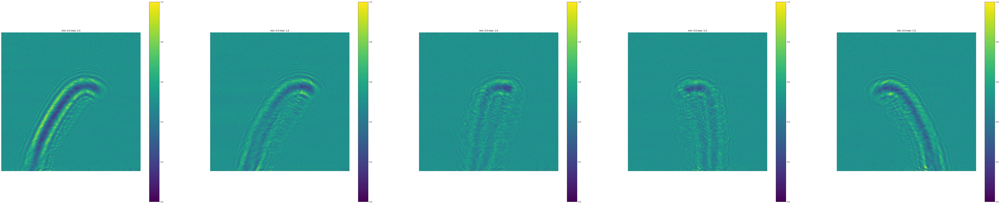

In [3]:

info = {
    'path': "/asap3/petra3/gpfs/p05/2018/data/11005102/processed/nano_2029_spider_hair/flat_field_corr/",
    'idx': list(np.arange(0, 900, 200)),
    'energy_kev': 18.0,
    'detector_pixel_size': 2.57 * 1e-6,
    'distance_sample_detector': 0.15,
    'pad': 1,
    'alpha': 1e-8,
    'iter_num': 1300,
    'init_model': False,
    'transform_type': 'brightness',
    'transform_factor': 0.5,
    'file_type': 'tiff',
}
args.update(info)
dataloader = Ganrec_Dataloader(**args)
dataloader.visualize(tranformed=True, show_or_plot='show')

# Chossing a model and creating a training function
Some alternatives are:
> #### 1. GAN, 
>> similar structure as the tensorflow Ganrec
> #### 2. Unet,
>> output channel of 2 and then propagation, then mean square error
> #### 3. Gan+Unet
>> the output of <b>2</b> will be propagated and input to a descriminator
> #### 4. Transformers
>> flattening and creating a 32x32 or 64x64 sized shapes that will then be inverse propagated, the energy, distance, and pixelsize information from which the phase and attenuation are retrieved. This is then followed by forward propagation and one of the three methods above will continue


# 1. Unet

In [6]:
class unet_Module(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, depth, bias, batch_norm, activation):
        super(unet_Module, self).__init__()
        self.depth = depth
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.bias = bias
        self.batch_norm = batch_norm
        self.activation = activation

        self.down_list = [2**(i+5) for i in range(depth)]
        self.up_list = [2**(4+depth-i) for i in range(depth)]
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.down_list = [in_channels] + self.down_list
        self.up_list = self.up_list + [out_channels]
        
        self.down_conv = nn.ModuleList([nn.Conv2d(self.down_list[i], self.down_list[i+1], kernel_size, stride, padding, bias=bias) for i in range(depth) if i < depth])
        self.up_conv = nn.ModuleList([nn.ConvTranspose2d(self.up_list[i], self.up_list[i+1], kernel_size, stride, padding, bias=bias) for i in range(depth)])
        self.down_bn = nn.ModuleList([nn.BatchNorm2d(self.down_list[i+1]) for i in range(depth)])
        self.up_bn = nn.ModuleList([nn.BatchNorm2d(self.up_list[i+1]) for i in range(depth)])
        self.concat_conv = nn.ModuleList([nn.ConvTranspose2d(self.up_list[i+1] + self.up_list[i], self.up_list[i+1], kernel_size, stride, padding, bias=bias) for i in range(depth-1)])
        self.downsample = nn.MaxPool2d(2, 2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.batch_norm = batch_norm
        
    
    def forward(self, x):
        """
        *********************************************************************************************************************************************
            first stage: convolution: 1 -> 32 -> 64 | then downsampling 
            second stage: convolution: 64 -> 128 | then downsampling 128 -> 256 | 
            third stage: conv: 256 -> 512 | downsampling: 512 -> 1024 | 
            fourthstage: deconv: 1024 -> 512 | upsampling: 512 -> 256 | 
            thirdstage: combine previous thirdstage and deconv: 512+256 -> 128 | 
            second stage: combine with prev second stage and deconv:  256 + 128 -> 64 | 
            first stage: combine with prev first stage and deconv: 64 -> 32 | 32 -> 2   where 2 is the number of output channels   
        *********************************************************************************************************************************************     
        """
        out = []
        x = self.down_conv[0](x)
        x = nn.ReLU()(x)

        
        for i in range(1,self.depth):          
            x = self.down_conv[i](x)
            if self.batch_norm:
                x = self.down_bn[i](x)
            x = nn.ReLU()(x)
            x = self.downsample(x)
            if i != self.depth-1:
                out.append(x)
        for i in range(self.depth - 1):
            x = self.up_conv[i](x)
            if i != 0:
                x = torch.cat([x, out[-i]], dim=1)
                x = self.concat_conv[i](x)
            x = self.upsample(x)
            if self.batch_norm:
                x = self.up_bn[i](x)
            x = nn.ReLU()(x)

        x = self.up_conv[self.depth-1](x)
        return x

summary(unet_Module(1, 2, 3, 1, 1, 4, False, True, True), (1, 256, 256))


Layer (type:depth-idx)                   Output Shape              Param #
├─ModuleList: 1                          []                        --
|    └─Conv2d: 2-1                       [-1, 32, 256, 256]        288
|    └─Conv2d: 2-2                       [-1, 64, 256, 256]        18,432
├─ModuleList: 1                          []                        --
|    └─BatchNorm2d: 2-3                  [-1, 64, 256, 256]        128
├─MaxPool2d: 1-1                         [-1, 64, 128, 128]        --
├─ModuleList: 1                          []                        --
|    └─Conv2d: 2-4                       [-1, 128, 128, 128]       73,728
├─ModuleList: 1                          []                        --
|    └─BatchNorm2d: 2-5                  [-1, 128, 128, 128]       256
├─MaxPool2d: 1-2                         [-1, 128, 64, 64]         --
├─ModuleList: 1                          []                        --
|    └─Conv2d: 2-6                       [-1, 256, 64, 64]         294,912

# 2. Unet Lightening

In [7]:

import pytorch_lightning as pl
class unet_light(pl.LightningModule):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, depth, bias, batch_norm, activation):
        super(unet_light, self).__init__()
        self.depth = depth
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.bias = bias
        self.batch_norm = batch_norm
        self.activation = activation
        self.in_channels = in_channels
        self.out_channels = out_channels
    
    def setup(self, stage=None):
        self.unet = unet_Module(self.in_channels, self.out_channels, self.kernel_size, self.stride, self.padding, self.depth, self.bias, self.batch_norm, self.activation)
        return self.unet
                                                      

un = unet_light(1, 2, 3, 1, 1,4, False, False, False), (1, 128, 128)

summary(un[0].setup())

Layer (type:depth-idx)                   Param #
├─ModuleList: 1-1                        --
|    └─Conv2d: 2-1                       288
|    └─Conv2d: 2-2                       18,432
|    └─Conv2d: 2-3                       73,728
|    └─Conv2d: 2-4                       294,912
├─ModuleList: 1-2                        --
|    └─ConvTranspose2d: 2-5              294,912
|    └─ConvTranspose2d: 2-6              73,728
|    └─ConvTranspose2d: 2-7              18,432
|    └─ConvTranspose2d: 2-8              576
├─ModuleList: 1-3                        --
|    └─BatchNorm2d: 2-9                  64
|    └─BatchNorm2d: 2-10                 128
|    └─BatchNorm2d: 2-11                 256
|    └─BatchNorm2d: 2-12                 512
├─ModuleList: 1-4                        --
|    └─BatchNorm2d: 2-13                 256
|    └─BatchNorm2d: 2-14                 128
|    └─BatchNorm2d: 2-15                 64
|    └─BatchNorm2d: 2-16                 4
├─ModuleList: 1-5                      

# 3. Vision Transformer

In [8]:
vit = models.vit_l_32(pretrained=True).cuda()
summary(vit)

Layer (type:depth-idx)                             Param #
├─Conv2d: 1-1                                      3,146,752
├─Encoder: 1-2                                     --
|    └─Dropout: 2-1                                --
|    └─Sequential: 2-2                             --
|    |    └─EncoderBlock: 3-1                      12,596,224
|    |    └─EncoderBlock: 3-2                      12,596,224
|    |    └─EncoderBlock: 3-3                      12,596,224
|    |    └─EncoderBlock: 3-4                      12,596,224
|    |    └─EncoderBlock: 3-5                      12,596,224
|    |    └─EncoderBlock: 3-6                      12,596,224
|    |    └─EncoderBlock: 3-7                      12,596,224
|    |    └─EncoderBlock: 3-8                      12,596,224
|    |    └─EncoderBlock: 3-9                      12,596,224
|    |    └─EncoderBlock: 3-10                     12,596,224
|    |    └─EncoderBlock: 3-11                     12,596,224
|    |    └─EncoderBlock: 3-12      

torch.Size([1, 1, 1015, 2560])

torch.Size([3, 1, 1015, 2560])

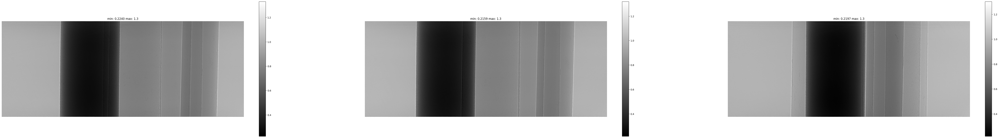

In [9]:
setup_info = {
    'path': "/asap3/petra3/gpfs/p05/2023/data/11016663//processed/thomas_001_d150/flat_corrected/rawBin2",
    'idx': 2,
    'energy_kev': 18.0,
    'detector_pixel_size': 2.57 * 1e-6,
    'distance_sample_detector': 0.15,
    'pad': 1,
    'alpha': 1e-8,
    'iter_num': 100, 
    'init_model': False,
    'file_type': 'tif',
    'transform_type': 'reshape',
}
args.update(setup_info)
dataloader = Ganrec_Dataloader(**args)
args["idx"] = [1, 20, 300]
args.update(get_all_info(**args))
dataloader = Ganrec_Dataloader(**args)
dataloader.visualize(show_or_plot='show')

torch.Size([1, 1, 2048, 2048])

torch.Size([3, 1, 2048, 2048])

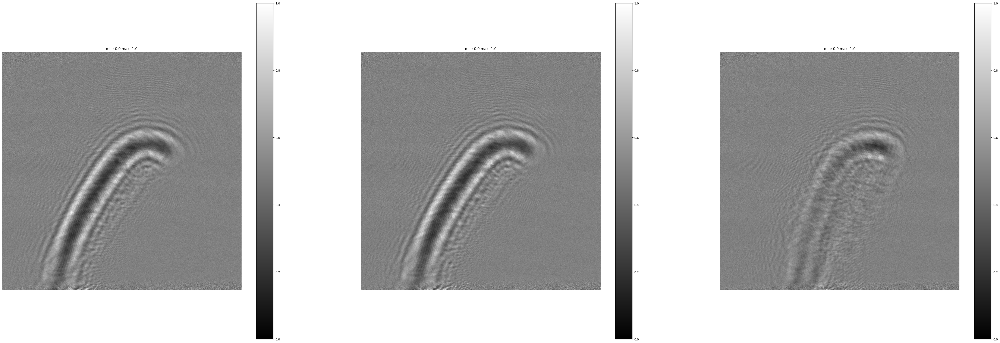

In [394]:

info = {
    'path': "/asap3/petra3/gpfs/p05/2018/data/11005102/processed/nano_2029_spider_hair/flat_field_corr/",
    'idx': 2,
    'energy_kev': 18.0,
    'detector_pixel_size': 2.57 * 1e-6,
    'distance_sample_detector': 0.15,
    'pad': 1,
    'alpha': 1e-8,
    'iter_num': 1300,
    'init_model': False,
    'transform_type': 'brightness',
    'transform_factor': 0.5,
    'file_type': 'tiff',
}
args.update(info)
dataloader = Ganrec_Dataloader(**args)
args["idx"] = [1, 20, 300]
args.update(get_all_info(**args))
dataloader = Ganrec_Dataloader(**args)
dataloader.visualize(tranformed=True, show_or_plot='show')